# 05 — Error Analysis

**Mục tiêu:** Phân tích sâu các lỗi của 3 models đã huấn luyện:
- SVM + HOG 
- Custom CNN 
- MobileNet 

**Câu hỏi chính:**
1. Model sai ở loại ảnh nào? (FP vs FN)
2. Khi sai, model có tự tin không? (confidence analysis)
3. 3 models đồng ý / bất đồng ở những ảnh nào? (cross-model overlap)

**Label convention:** fake=0, real=1

In [20]:
# ── Cell 1: Imports & Constants ──────────────────────────────────────────────
import sys, os, pathlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import joblib
import tensorflow as tf
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler

# Thêm src/ vào path để import dataset.py
PROJECT_ROOT = pathlib.Path.cwd().parent   # notebooks/ → project root
sys.path.insert(0, str(PROJECT_ROOT / "src"))
from dataset import build_dataframe, split_dataframe, load_images_numpy, make_tf_dataset

# ── Paths ─────────────────────────────────────────────────────────────────────
DATA_DIR    = PROJECT_ROOT / "data" / "raw"
MODELS_DIR  = PROJECT_ROOT / "models"
REPORTS_DIR = PROJECT_ROOT / "reports" / "error_analysis"
REPORTS_DIR.mkdir(parents=True, exist_ok=True)

# ── Constants (phải khớp với các notebook trước) ─────────────────────────────
IMG_SIZE   = (224, 224)
BATCH_SIZE = 32
SEED       = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

# ── HOG params (phải khớp với 02_baseline.ipynb) ─────────────────────────────
HOG_IMG_SIZE        = (64, 64)
HOG_ORIENTATIONS    = 9
HOG_PIXELS_PER_CELL = (8, 8)
HOG_CELLS_PER_BLOCK = (2, 2)

LABEL_NAMES = {0: "Fake", 1: "Real"}
print("✅ Imports OK")
print(f"   PROJECT_ROOT = {PROJECT_ROOT}")
print(f"   REPORTS_DIR  = {REPORTS_DIR}")

✅ Imports OK
   PROJECT_ROOT = e:\HK4\Sta_ML\DO_ÂNNANANANNA\deepfake-detection
   REPORTS_DIR  = e:\HK4\Sta_ML\DO_ÂNNANANANNA\deepfake-detection\reports\error_analysis


In [21]:
# ── Cell 2: Load Test Data ────────────────────────────────────────────────────
print("📂 Đang build dataframe...")
df_all = build_dataframe(DATA_DIR)

print("✂️  Đang split (phải khớp với notebook 02/03/04)...")
train_df, val_df, test_df = split_dataframe(
    df_all,
    val_size=0.15,
    test_size=0.15,
    random_state=42,   # PHẢI giống các notebook trước
)

print(f"\n✅ Test set: {len(test_df)} ảnh")
print(f"   - Fake (0): {(test_df['label']==0).sum()}")
print(f"   - Real (1): {(test_df['label']==1).sum()}")

# Giữ test_df gốc để sau này lấy path ảnh hiển thị
y_true = test_df["label"].values  # (3000,) — nhãn đúng

📂 Đang build dataframe...
✂️  Đang split (phải khớp với notebook 02/03/04)...

✅ Test set: 3000 ảnh
   - Fake (0): 1500
   - Real (1): 1500


## Lý thuyết: 4 loại lỗi

| Ký hiệu | Ý nghĩa | Hậu quả |
|---------|---------|---------|
| TN | Fake → đúng là Fake | ✅ |
| TP | Real → đúng là Real | ✅ |
| **FP** | **Fake → nhầm là Real** | Deepfake lọt qua |
| **FN** | **Real → nhầm là Fake** | Ảnh thật bị oan |

**FP Rate** = FP / (FP + TN) — tỉ lệ fake bị nhầm thành real  
**FN Rate** = FN / (FN + TP) — tỉ lệ real bị nhầm thành fake

In [22]:
# ── Cell 4: Load Models & Compute Predictions ─────────────────────────────────
# 
# Pipeline preprocessing:
#   SVM    : load_images_numpy → resize 64×64 → HOG features → StandardScaler
#   CNN    : make_tf_dataset → [0,1] normalized → model predict
#   MobileNet: make_tf_dataset → [0,1] normalized → model predict
#              (Rescaling [-1,1] đã nằm trong model)
# ─────────────────────────────────────────────────────────────────────────────

results = {}   # key = model_name, value = {"y_pred": ..., "y_prob": ...}

# ── Cell 4a. SVM + HOG ──────────────────────────────────────────────
from tqdm import tqdm

print("=" * 55)
print("  Loading SVM + HOG...")
svm_model  = joblib.load(MODELS_DIR / "svm_model.joblib")
svm_scaler = joblib.load(MODELS_DIR / "svm_scaler.joblib")

# SVM dùng 64×64 (khớp với 02_baseline.ipynb)
SVM_IMG_SIZE = (64, 64)
print("  Loading test images (64×64) for HOG...")
X_test_64, _ = load_images_numpy(test_df, img_size=SVM_IMG_SIZE)

# HOG giống hệt 02_baseline.ipynb: channel_axis=-1 (RGB trực tiếp, KHÔNG grayscale)
def extract_hog_features(X):
    """X: (N, 64, 64, 3) float32 [0,1] → HOG features"""
    features = []
    for img in tqdm(X, desc="HOG", unit="img"):
        feat = hog(
            img,
            orientations=9,
            pixels_per_cell=(8, 8),
            cells_per_block=(2, 2),
            channel_axis=-1,   # ← RGB, không convert grayscale
        )
        features.append(feat)
    return np.array(features)

print("  Extracting HOG features...")
X_test_hog    = extract_hog_features(X_test_64)
X_test_scaled = svm_scaler.transform(X_test_hog)

# probability=True đã set lúc train → dùng predict_proba trực tiếp
svm_pred = svm_model.predict(X_test_scaled)
svm_prob = svm_model.predict_proba(X_test_scaled)[:, 1]  # xác suất lớp real

results["SVM + HOG"] = {"y_pred": svm_pred, "y_prob": svm_prob}
print(f"  ✅ SVM done — accuracy: {(svm_pred == y_true).mean():.4f}")


# ── 4b. Custom CNN ────────────────────────────────────────────────────────────
print("\n  Loading Custom CNN...")
cnn_model = tf.keras.models.load_model(MODELS_DIR / "cnn_best.keras")

test_ds_cnn = make_tf_dataset(test_df, img_size=IMG_SIZE, batch_size=BATCH_SIZE,
                               augment=False, shuffle=False)
cnn_prob_raw = cnn_model.predict(test_ds_cnn, verbose=1)   # shape (3000, 1)
cnn_prob = cnn_prob_raw.flatten()                           # (3000,)
cnn_pred = (cnn_prob >= 0.5).astype(int)

results["Custom CNN"] = {"y_pred": cnn_pred, "y_prob": cnn_prob}
print(f"  ✅ CNN done — accuracy: {(cnn_pred == y_true).mean():.4f}")


# ── 4c. MobileNet ─────────────────────────────────────────────────────────────
print("\n  Loading MobileNet...")
mobilenet_model = tf.keras.models.load_model(MODELS_DIR / "mobilenet_best.keras")

test_ds_mobile = make_tf_dataset(test_df, img_size=IMG_SIZE, batch_size=BATCH_SIZE,
                                  augment=False, shuffle=False)
mobile_prob_raw = mobilenet_model.predict(test_ds_mobile, verbose=1)
mobile_prob = mobile_prob_raw.flatten()
mobile_pred = (mobile_prob >= 0.5).astype(int)

results["MobileNet"] = {"y_pred": mobile_pred, "y_prob": mobile_prob}
print(f"  ✅ MobileNet done — accuracy: {(mobile_pred == y_true).mean():.4f}")

print("\n✅ Tất cả models đã load và predict xong.")

  Loading SVM + HOG...
  Loading test images (64×64) for HOG...
  Extracting HOG features...


HOG: 100%|██████████| 3000/3000 [00:03<00:00, 917.78img/s]


  ✅ SVM done — accuracy: 0.7230

  Loading Custom CNN...
94/94 ━━━━━━━━━━━━━━━━━━━━ 56s 594ms/step
  ✅ CNN done — accuracy: 0.9343

  Loading MobileNet...
94/94 ━━━━━━━━━━━━━━━━━━━━ 67s 704ms/step
  ✅ MobileNet done — accuracy: 0.9673

✅ Tất cả models đã load và predict xong.



📊 ERROR RATE BREAKDOWN

Model              Acc     FP     FN   FP Rate   FN Rate  Errors
-----------------------------------------------------------------
SVM + HOG       0.7230    413    418    0.2753    0.2787     831
Custom CNN      0.9343    124     73    0.0827    0.0487     197
MobileNet       0.9673     51     47    0.0340    0.0313      98


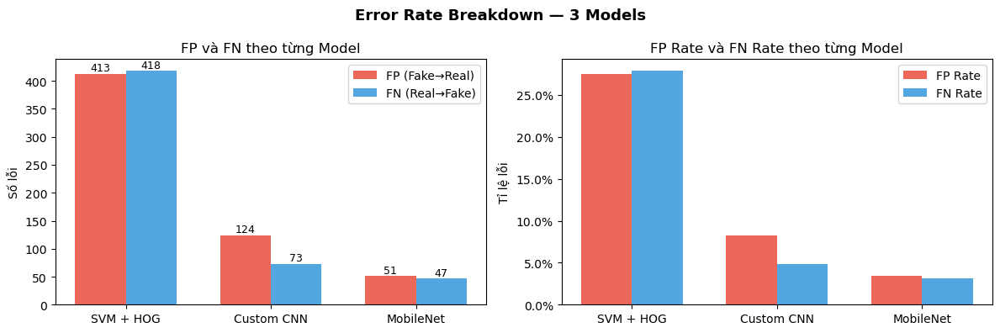

✅ Lưu → reports/error_analysis/error_rate_breakdown.png


In [33]:
# ── Cell 5: Error Rate Breakdown ─────────────────────────────────────────────
from sklearn.metrics import confusion_matrix

print("\n📊 ERROR RATE BREAKDOWN\n")
print(f"{'Model':<15} {'Acc':>6} {'FP':>6} {'FN':>6} {'FP Rate':>9} {'FN Rate':>9} {'Errors':>7}")
print("-" * 65)

breakdown = []
for model_name, res in results.items():
    y_pred = res["y_pred"]
    
    cm = confusion_matrix(y_true, y_pred)
    # cm[0,0]=TN, cm[0,1]=FP, cm[1,0]=FN, cm[1,1]=TP
    TN, FP, FN, TP = cm[0,0], cm[0,1], cm[1,0], cm[1,1]
    
    acc      = (TP + TN) / len(y_true)
    fp_rate  = FP / (FP + TN)   # tỉ lệ fake bị nhầm là real
    fn_rate  = FN / (FN + TP)   # tỉ lệ real bị nhầm là fake
    n_errors = FP + FN
    
    print(f"{model_name:<15} {acc:>6.4f} {FP:>6} {FN:>6} {fp_rate:>9.4f} {fn_rate:>9.4f} {n_errors:>7}")
    breakdown.append({
        "model": model_name, "accuracy": acc,
        "FP": FP, "FN": FN, "FP_rate": fp_rate, "FN_rate": fn_rate,
        "total_errors": n_errors,
        "TN": TN, "TP": TP,
    })

df_breakdown = pd.DataFrame(breakdown)

# ── Vẽ biểu đồ FP vs FN ───────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
model_names = df_breakdown["model"].tolist()
x = np.arange(len(model_names))
width = 0.35

# Subplot 1: FP và FN counts
axes[0].bar(x - width/2, df_breakdown["FP"], width, label="FP (Fake→Real)", color="#e74c3c", alpha=0.85)
axes[0].bar(x + width/2, df_breakdown["FN"], width, label="FN (Real→Fake)", color="#3498db", alpha=0.85)
axes[0].set_xticks(x)
axes[0].set_xticklabels(model_names)
axes[0].set_ylabel("Số lỗi")
axes[0].set_title("FP và FN theo từng Model")
axes[0].legend()
for i, v in enumerate(df_breakdown["FP"]):
    axes[0].text(i - width/2, v + 5, str(v), ha='center', fontsize=9)
for i, v in enumerate(df_breakdown["FN"]):
    axes[0].text(i + width/2, v + 5, str(v), ha='center', fontsize=9)

# Subplot 2: FP Rate và FN Rate
axes[1].bar(x - width/2, df_breakdown["FP_rate"], width, label="FP Rate", color="#e74c3c", alpha=0.85)
axes[1].bar(x + width/2, df_breakdown["FN_rate"], width, label="FN Rate", color="#3498db", alpha=0.85)
axes[1].set_xticks(x)
axes[1].set_xticklabels(model_names)
axes[1].set_ylabel("Tỉ lệ lỗi")
axes[1].set_title("FP Rate và FN Rate theo từng Model")
axes[1].legend()
axes[1].yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.1%}'))

plt.suptitle("Error Rate Breakdown — 3 Models", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(REPORTS_DIR / "error_rate_breakdown.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"✅ Lưu → reports/error_analysis/error_rate_breakdown.png")

In [34]:
# ── Cập nhật all_results.csv với số từ local test set ─────────────────────────
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score

rows = []
for model_name, res in results.items():
    yp    = res["y_pred"]
    yprob = res["y_prob"]
    rows.append({
        "model"    : model_name,
        "accuracy" : round((yp == y_true).mean(), 4),
        "precision": round(precision_score(y_true, yp, zero_division=0), 4),
        "recall"   : round(recall_score(y_true, yp, zero_division=0), 4),
        "f1"       : round(f1_score(y_true, yp, zero_division=0), 4),
        "roc_auc"  : round(roc_auc_score(y_true, yprob), 4),
    })

df_final = pd.DataFrame(rows)
df_final.to_csv(PROJECT_ROOT / "reports" / "all_results.csv", index=False)
print("✅ Đã update all_results.csv:")
print(df_final.to_string(index=False))

✅ Đã update all_results.csv:
     model  accuracy  precision  recall     f1  roc_auc
 SVM + HOG    0.7230     0.7237  0.7213 0.7225   0.8007
Custom CNN    0.9343     0.9201  0.9513 0.9354   0.9783
 MobileNet    0.9673     0.9661  0.9687 0.9674   0.9937


## Phần 1: Visualize Ảnh Sai

Hiển thị 20 ảnh False Positive (fake bị nhầm là real) và 20 ảnh
False Negative (real bị nhầm là fake) cho từng model.

**Mục tiêu:** dùng mắt quan sát xem có pattern gì không.

In [24]:
# ── Cell 7: Hàm visualize ảnh sai ────────────────────────────────────────────
from PIL import Image as PILImage

def show_error_grid(test_df, y_true, y_pred, y_prob, 
                    error_type="FP", model_name="Model",
                    n_show=20, save_path=None):
    """
    Hiển thị lưới ảnh lỗi.
    
    Parameters
    ----------
    error_type : "FP" (Fake→Real) hoặc "FN" (Real→Fake)
    n_show     : số ảnh tối đa hiển thị
    """
    if error_type == "FP":
        # Fake (true=0) nhưng predict là Real (pred=1)
        mask = (y_true == 0) & (y_pred == 1)
        title_prefix = "FP — Fake bị nhầm là Real"
        border_color = "#e74c3c"  # đỏ
    else:  # FN
        # Real (true=1) nhưng predict là Fake (pred=0)
        mask = (y_true == 1) & (y_pred == 0)
        title_prefix = "FN — Real bị nhầm là Fake"
        border_color = "#3498db"  # xanh

    error_indices = np.where(mask)[0]
    n_total = len(error_indices)
    
    if n_total == 0:
        print(f"  Không có lỗi {error_type}!")
        return
    
    # Lấy n_show ảnh ngẫu nhiên (có seed để tái hiện)
    rng = np.random.default_rng(seed=42)
    chosen = rng.choice(error_indices, size=min(n_show, n_total), replace=False)
    chosen_probs = y_prob[chosen]
    
    # Sort theo prob (cao → thấp) để thấy lỗi tự tin trước
    sort_order = np.argsort(chosen_probs)[::-1]
    chosen = chosen[sort_order]
    chosen_probs = chosen_probs[sort_order]
    
    # Vẽ lưới 4×5
    n_cols = 5
    n_rows = (min(n_show, n_total) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*2.5, n_rows*2.7))
    axes = axes.flatten()
    
    for i, (idx, prob) in enumerate(zip(chosen, chosen_probs)):
        img_path = test_df.iloc[idx]["path"]
        true_label = y_true[idx]
        
        img = PILImage.open(img_path).convert("RGB").resize((224, 224))
        
        axes[i].imshow(img)
        axes[i].axis("off")
        axes[i].set_title(
            f"True: {LABEL_NAMES[true_label]}\np={prob:.3f}",
            fontsize=8
        )
        # Viền màu dựa trên error type
        for spine in axes[i].spines.values():
            spine.set_visible(True)
            spine.set_color(border_color)
            spine.set_linewidth(2)
    
    # Ẩn axes thừa
    for j in range(len(chosen), len(axes)):
        axes[j].axis("off")
    
    fig.suptitle(
        f"{model_name} — {title_prefix}\n"
        f"({n_total} lỗi tổng, hiển thị {len(chosen)}, sắp xếp theo confidence giảm dần)",
        fontsize=11, fontweight='bold'
    )
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=120, bbox_inches="tight")
        print(f"  ✅ Lưu → {save_path}")
    plt.show()

print("✅ Hàm show_error_grid đã định nghĩa xong.")

✅ Hàm show_error_grid đã định nghĩa xong.


  SVM + HOG — Error Visualization
  ✅ Lưu → e:\HK4\Sta_ML\DO_ÂNNANANANNA\deepfake-detection\reports\error_analysis\svm_FP.png


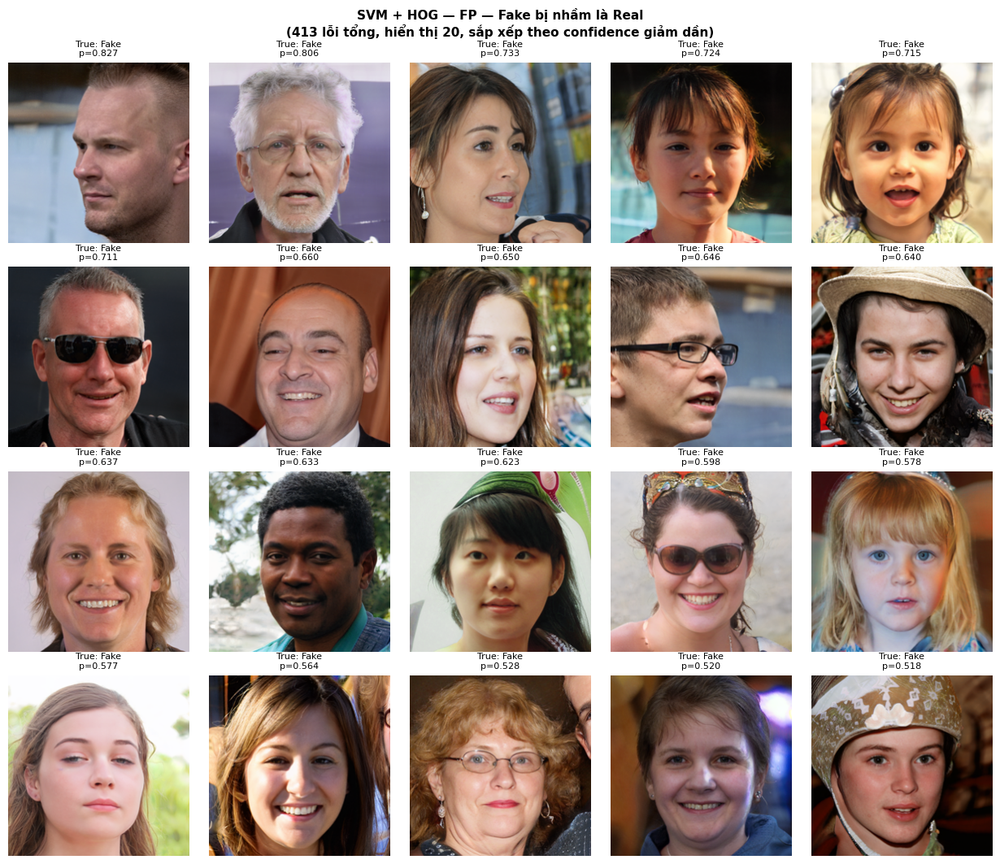

  ✅ Lưu → e:\HK4\Sta_ML\DO_ÂNNANANANNA\deepfake-detection\reports\error_analysis\svm_FN.png


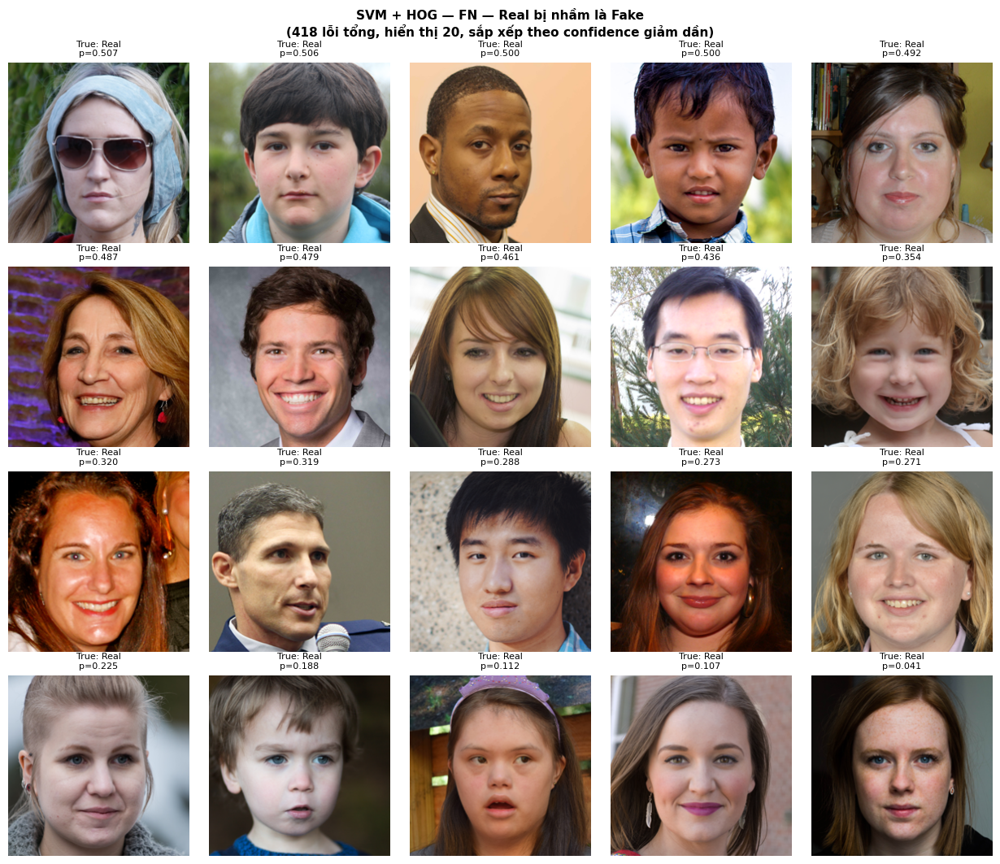

In [25]:
# ── Cell 8: Visualize lỗi SVM ────────────────────────────────────────────────
print("=" * 50)
print("  SVM + HOG — Error Visualization")
print("=" * 50)

svm_pred = results["SVM + HOG"]["y_pred"]
svm_prob = results["SVM + HOG"]["y_prob"]

show_error_grid(test_df, y_true, svm_pred, svm_prob,
                error_type="FP", model_name="SVM + HOG", n_show=20,
                save_path=REPORTS_DIR / "svm_FP.png")

show_error_grid(test_df, y_true, svm_pred, svm_prob,
                error_type="FN", model_name="SVM + HOG", n_show=20,
                save_path=REPORTS_DIR / "svm_FN.png")

  Custom CNN — Error Visualization
  ✅ Lưu → e:\HK4\Sta_ML\DO_ÂNNANANANNA\deepfake-detection\reports\error_analysis\cnn_FP.png


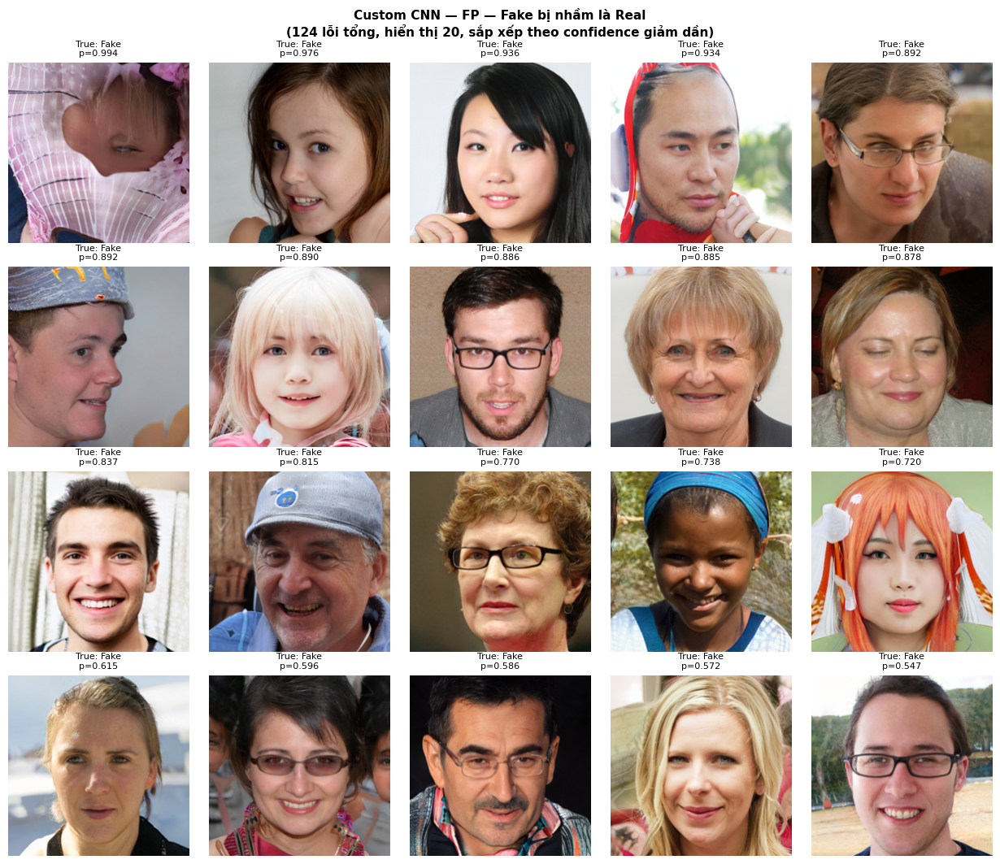

  ✅ Lưu → e:\HK4\Sta_ML\DO_ÂNNANANANNA\deepfake-detection\reports\error_analysis\cnn_FN.png


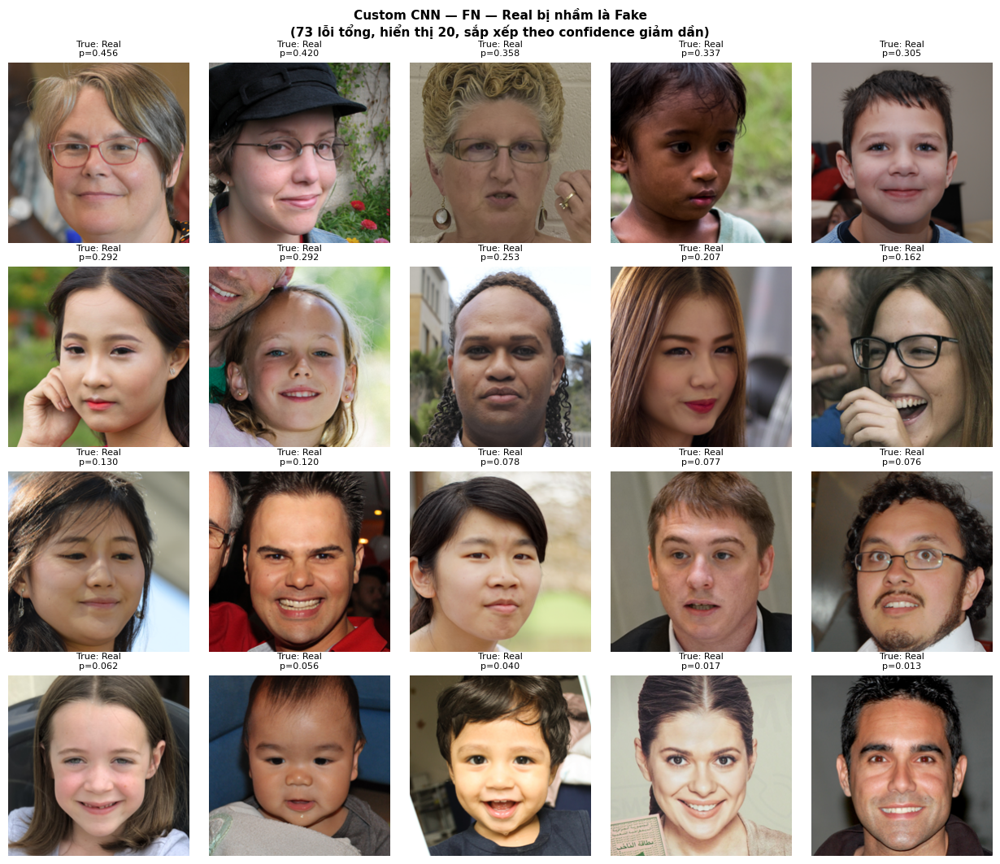

In [26]:
# ── Cell 9: Visualize lỗi CNN ────────────────────────────────────────────────
print("=" * 50)
print("  Custom CNN — Error Visualization")
print("=" * 50)

cnn_pred = results["Custom CNN"]["y_pred"]
cnn_prob = results["Custom CNN"]["y_prob"]

show_error_grid(test_df, y_true, cnn_pred, cnn_prob,
                error_type="FP", model_name="Custom CNN", n_show=20,
                save_path=REPORTS_DIR / "cnn_FP.png")

show_error_grid(test_df, y_true, cnn_pred, cnn_prob,
                error_type="FN", model_name="Custom CNN", n_show=20,
                save_path=REPORTS_DIR / "cnn_FN.png")

  MobileNet — Error Visualization
  ✅ Lưu → e:\HK4\Sta_ML\DO_ÂNNANANANNA\deepfake-detection\reports\error_analysis\mobilenet_FP.png


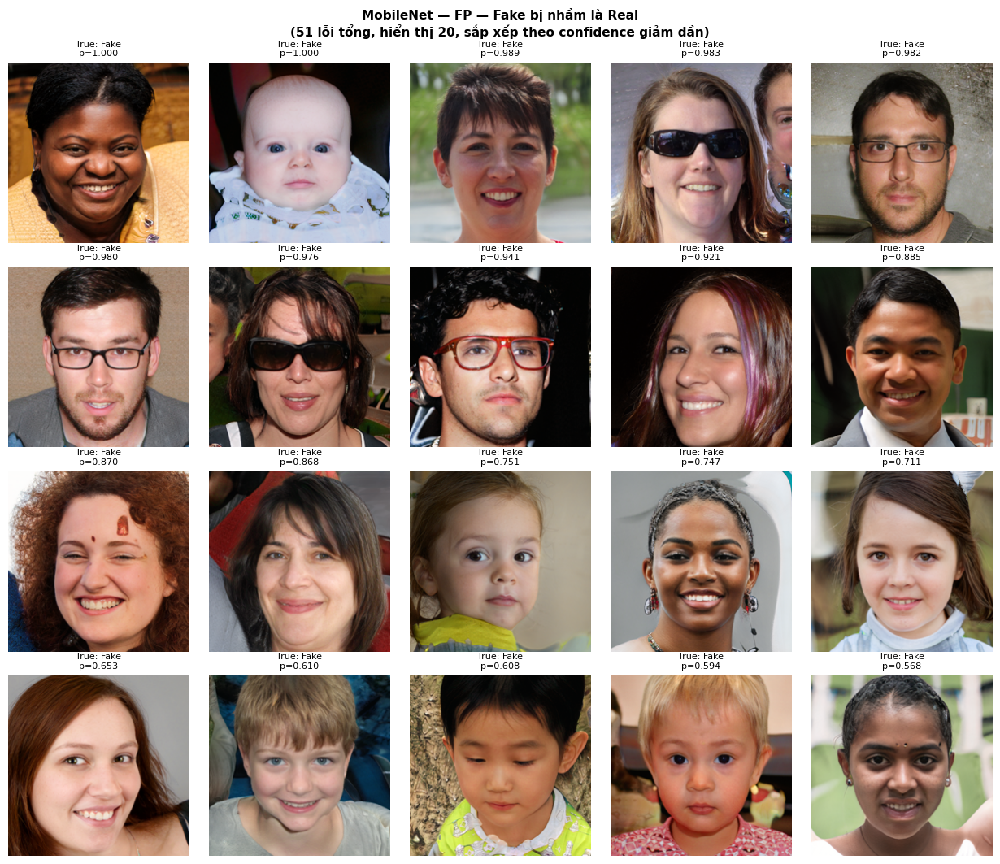

  ✅ Lưu → e:\HK4\Sta_ML\DO_ÂNNANANANNA\deepfake-detection\reports\error_analysis\mobilenet_FN.png


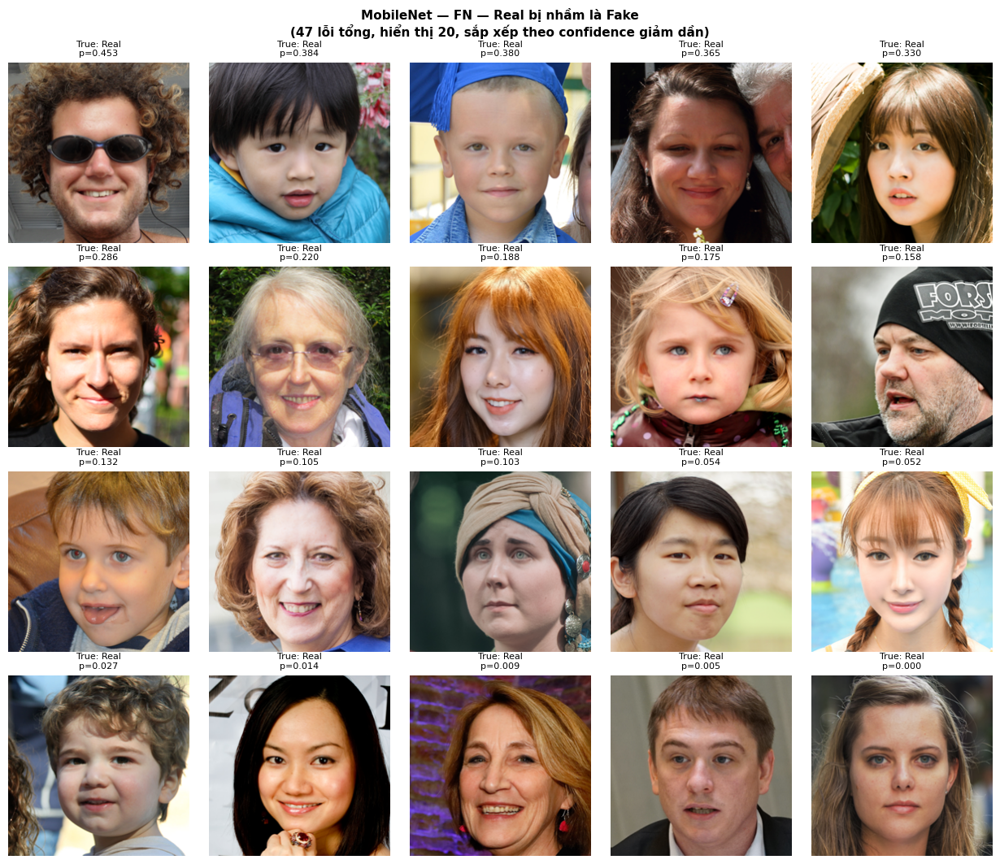

In [27]:
# ── Cell 10: Visualize lỗi MobileNet ─────────────────────────────────────────
print("=" * 50)
print("  MobileNet — Error Visualization")
print("=" * 50)

mobile_pred = results["MobileNet"]["y_pred"]
mobile_prob = results["MobileNet"]["y_prob"]

show_error_grid(test_df, y_true, mobile_pred, mobile_prob,
                error_type="FP", model_name="MobileNet", n_show=20,
                save_path=REPORTS_DIR / "mobilenet_FP.png")

show_error_grid(test_df, y_true, mobile_pred, mobile_prob,
                error_type="FN", model_name="MobileNet", n_show=20,
                save_path=REPORTS_DIR / "mobilenet_FN.png")

## Phần 2: Confidence Analysis

**Câu hỏi:** Khi model sai, model có "biết" rằng nó đang không chắc không?

- **High-confidence error** (prob > 0.8 nhưng sai): Model tự tin nhưng sai → loại lỗi nguy hiểm nhất
- **Low-confidence error** (prob 0.45–0.55): Model phân vân → lỗi này dễ hiểu hơn

Ta sẽ vẽ phân phối confidence (xác suất) của các lỗi và correct predictions.

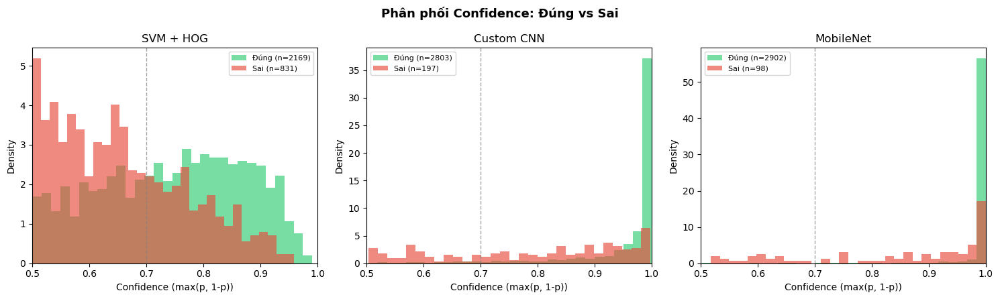

✅ Lưu → reports/error_analysis/confidence_distribution.png


In [28]:
# ── Cell 12: Confidence Distribution ─────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(15, 4.5))

for ax, (model_name, res) in zip(axes, results.items()):
    y_pred = res["y_pred"]
    y_prob = res["y_prob"]
    
    correct_mask = (y_pred == y_true)
    wrong_mask   = ~correct_mask
    
    # Confidence = max(prob, 1-prob)  →  luôn trong [0.5, 1.0]
    confidence = np.where(y_prob >= 0.5, y_prob, 1 - y_prob)
    
    ax.hist(confidence[correct_mask], bins=30, alpha=0.65,
            color="#2ecc71", label=f"Đúng (n={correct_mask.sum()})", density=True)
    ax.hist(confidence[wrong_mask], bins=30, alpha=0.65,
            color="#e74c3c", label=f"Sai (n={wrong_mask.sum()})", density=True)
    
    ax.axvline(x=0.7, color='gray', linestyle='--', linewidth=1, alpha=0.7)
    ax.set_xlabel("Confidence (max(p, 1-p))")
    ax.set_ylabel("Density")
    ax.set_title(f"{model_name}")
    ax.legend(fontsize=8)
    ax.set_xlim(0.5, 1.0)

plt.suptitle("Phân phối Confidence: Đúng vs Sai", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(REPORTS_DIR / "confidence_distribution.png", dpi=150, bbox_inches="tight")
plt.show()
print("✅ Lưu → reports/error_analysis/confidence_distribution.png")

In [29]:
# ── Cell 13: High-Confidence Errors (nguy hiểm nhất) ─────────────────────────
print("📊 HIGH-CONFIDENCE ERRORS (confidence > 0.80)\n")
print(f"{'Model':<15} {'HC Errors':>10} {'HC FP':>8} {'HC FN':>8} {'HC Error %':>12}")
print("-" * 55)

hc_threshold = 0.80
hc_summary = []

for model_name, res in results.items():
    y_pred = res["y_pred"]
    y_prob = res["y_prob"]
    
    wrong_mask = (y_pred != y_true)
    confidence = np.where(y_prob >= 0.5, y_prob, 1 - y_prob)
    
    hc_wrong = wrong_mask & (confidence > hc_threshold)
    hc_fp = ((y_true == 0) & (y_pred == 1) & (confidence > hc_threshold)).sum()
    hc_fn = ((y_true == 1) & (y_pred == 0) & (confidence > hc_threshold)).sum()
    
    n_hc_err = hc_wrong.sum()
    pct = n_hc_err / wrong_mask.sum() * 100 if wrong_mask.sum() > 0 else 0
    
    print(f"{model_name:<15} {n_hc_err:>10} {hc_fp:>8} {hc_fn:>8} {pct:>11.1f}%")
    hc_summary.append({"model": model_name, "hc_errors": n_hc_err,
                        "hc_fp": hc_fp, "hc_fn": hc_fn, "pct_of_errors": pct})

print("\n💡 HC Error = model tự tin > 80% nhưng vẫn dự đoán sai")
print("   Đây là dạng lỗi nguy hiểm nhất trong thực tế deployment")

📊 HIGH-CONFIDENCE ERRORS (confidence > 0.80)

Model            HC Errors    HC FP    HC FN   HC Error %
-------------------------------------------------------
SVM + HOG              116       59       57        14.0%
Custom CNN             108       70       38        54.8%
MobileNet               68       37       31        69.4%

💡 HC Error = model tự tin > 80% nhưng vẫn dự đoán sai
   Đây là dạng lỗi nguy hiểm nhất trong thực tế deployment


## Phần 3: Cross-Model Error Overlap

**Câu hỏi:** Những ảnh nào mà nhiều model cùng sai?

- **Sai ở cả 3 model** → Ảnh khó, possibily edge cases hoặc dataset noise
- **Chỉ SVM sai** → HOG features không đủ phân biệt, deep features tốt hơn  
- **SVM + CNN sai, MobileNet đúng** → Transfer learning pretrained features giải quyết được
- **Chỉ MobileNet sai** → Overfitting pattern cụ thể

  CROSS-MODEL ERROR OVERLAP
  Cả 3 ĐÚNG          :  2044 ảnh (68.1%)
  Chỉ SVM sai        :   690 ảnh
  Chỉ CNN sai        :    74 ảnh
  Chỉ MobileNet sai  :    41 ảnh
  SVM + CNN sai      :    94 ảnh
  SVM + MobileNet sai:    28 ảnh
  CNN + MobileNet sai:    10 ảnh
  Cả 3 ĐỀU SAI      :    19 ảnh  ← Hard cases!


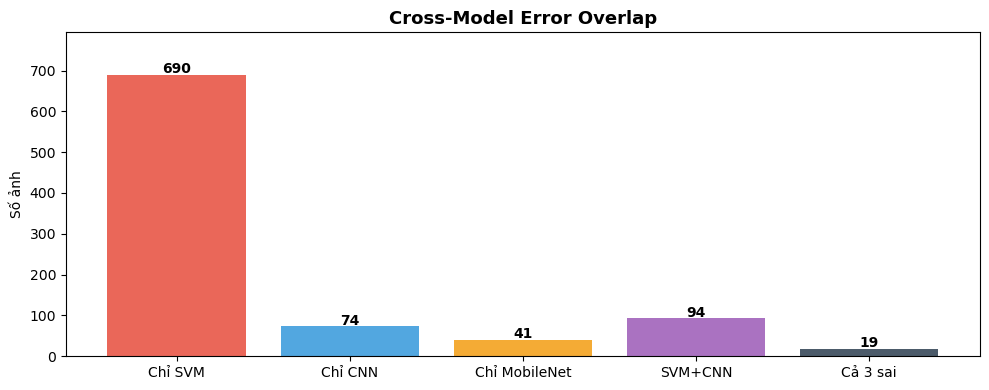

✅ Lưu → reports/error_analysis/cross_model_overlap.png


In [30]:
# ── Cell 15: Cross-model Error Overlap ────────────────────────────────────────
svm_wrong    = (results["SVM + HOG"]["y_pred"]  != y_true)
cnn_wrong    = (results["Custom CNN"]["y_pred"]  != y_true)
mobile_wrong = (results["MobileNet"]["y_pred"]   != y_true)

# Tập lỗi theo combination
only_svm    = svm_wrong & ~cnn_wrong & ~mobile_wrong
only_cnn    = ~svm_wrong & cnn_wrong & ~mobile_wrong
only_mobile = ~svm_wrong & ~cnn_wrong & mobile_wrong

svm_cnn         = svm_wrong & cnn_wrong & ~mobile_wrong
svm_mobile      = svm_wrong & ~cnn_wrong & mobile_wrong
cnn_mobile      = ~svm_wrong & cnn_wrong & mobile_wrong
all_three_wrong = svm_wrong & cnn_wrong & mobile_wrong

all_three_right = ~svm_wrong & ~cnn_wrong & ~mobile_wrong

print("=" * 55)
print("  CROSS-MODEL ERROR OVERLAP")
print("=" * 55)
print(f"  Cả 3 ĐÚNG          : {all_three_right.sum():>5} ảnh ({all_three_right.mean()*100:.1f}%)")
print(f"  Chỉ SVM sai        : {only_svm.sum():>5} ảnh")
print(f"  Chỉ CNN sai        : {only_cnn.sum():>5} ảnh")
print(f"  Chỉ MobileNet sai  : {only_mobile.sum():>5} ảnh")
print(f"  SVM + CNN sai      : {svm_cnn.sum():>5} ảnh")
print(f"  SVM + MobileNet sai: {svm_mobile.sum():>5} ảnh")
print(f"  CNN + MobileNet sai: {cnn_mobile.sum():>5} ảnh")
print(f"  Cả 3 ĐỀU SAI      : {all_three_wrong.sum():>5} ảnh  ← Hard cases!")
print("=" * 55)

overlap_masks = {
    "Chỉ SVM": only_svm,
    "Chỉ CNN": only_cnn,
    "Chỉ MobileNet": only_mobile,
    "SVM+CNN": svm_cnn,
    "Cả 3 sai": all_three_wrong,
}

# Vẽ bar chart
fig, ax = plt.subplots(figsize=(10, 4))
labels = list(overlap_masks.keys())
counts = [m.sum() for m in overlap_masks.values()]
colors = ["#e74c3c", "#3498db", "#f39c12", "#9b59b6", "#2c3e50"]

bars = ax.bar(labels, counts, color=colors, alpha=0.85)
for bar, count in zip(bars, counts):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 3,
            str(count), ha='center', fontsize=10, fontweight='bold')
ax.set_ylabel("Số ảnh")
ax.set_title("Cross-Model Error Overlap", fontsize=13, fontweight='bold')
ax.set_ylim(0, max(counts) * 1.15)
plt.tight_layout()
plt.savefig(REPORTS_DIR / "cross_model_overlap.png", dpi=150, bbox_inches="tight")
plt.show()
print("✅ Lưu → reports/error_analysis/cross_model_overlap.png")

🔴 Hard cases: 19 ảnh mà cả 3 model đều sai



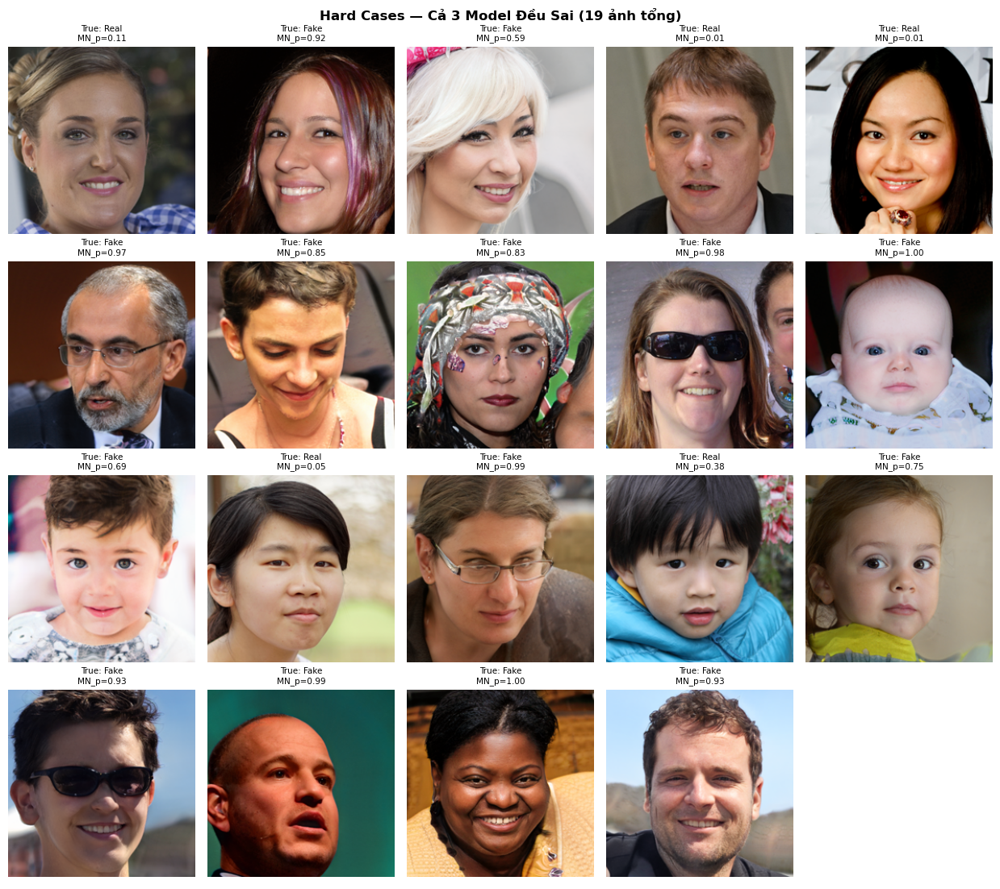

✅ Lưu → reports/error_analysis/hard_cases.png


In [31]:
# ── Cell 16: Hard Cases — cả 3 model đều sai ─────────────────────────────────
hard_indices = np.where(all_three_wrong)[0]
print(f"🔴 Hard cases: {len(hard_indices)} ảnh mà cả 3 model đều sai\n")

if len(hard_indices) > 0:
    n_show = min(20, len(hard_indices))
    rng = np.random.default_rng(42)
    chosen = rng.choice(hard_indices, size=n_show, replace=False)
    
    n_cols = 5
    n_rows = (n_show + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*2.5, n_rows*2.8))
    axes = axes.flatten()
    
    for i, idx in enumerate(chosen):
        img_path = test_df.iloc[idx]["path"]
        true_label = y_true[idx]
        
        # Lấy confidence của MobileNet (model tốt nhất)
        mobile_p = results["MobileNet"]["y_prob"][idx]
        
        img = PILImage.open(img_path).convert("RGB").resize((224, 224))
        axes[i].imshow(img)
        axes[i].axis("off")
        axes[i].set_title(
            f"True: {LABEL_NAMES[true_label]}\n"
            f"MN_p={mobile_p:.2f}",
            fontsize=7.5
        )
        # Viền vàng = hard case
        for spine in axes[i].spines.values():
            spine.set_visible(True)
            spine.set_color("#f39c12")
            spine.set_linewidth(2.5)
    
    for j in range(n_show, len(axes)):
        axes[j].axis("off")
    
    plt.suptitle(
        f"Hard Cases — Cả 3 Model Đều Sai ({len(hard_indices)} ảnh tổng)",
        fontsize=12, fontweight='bold'
    )
    plt.tight_layout()
    plt.savefig(REPORTS_DIR / "hard_cases.png", dpi=120, bbox_inches="tight")
    plt.show()
    print(f"✅ Lưu → reports/error_analysis/hard_cases.png")
else:
    print("Không có hard cases — cả 3 model không cùng sai ảnh nào!")

## Kết luận Error Analysis

### Tổng kết lỗi
| Model | Accuracy | FP (Fake→Real) | FN (Real→Fake) | Tổng lỗi |
|-------|----------|----------------|----------------|----------|
| SVM + HOG  | 72.30% | 413 (27.5%) | 418 (27.9%) | 831 |
| Custom CNN | 93.43% | 124 (8.3%)  | 73 (4.9%)   | 197 |
| MobileNet  | 96.73% | 51 (3.4%)   | 47 (3.1%)   | 98  |

### Nhận xét chính

**SVM + HOG:** Lỗi phân bổ gần bằng nhau giữa FP và FN (413 vs 418) —
HOG features không đủ phân biệt hai lớp, model phân vân ở cả hai chiều.
Đây là kết quả baseline dự kiến khi chỉ dùng hand-crafted features.

**Custom CNN:** FP nhiều hơn FN rõ rệt (124 vs 73) — CNN có xu hướng
thiên về dự đoán Real, khiến ảnh Fake lọt qua nhiều hơn bị oan ảnh Real.
Tuy nhiên accuracy 93.43% cho thấy deep features học được từ pixel
hiệu quả hơn HOG đáng kể.

**MobileNet:** Lỗi ít nhất và cân bằng nhất (51 vs 47) — transfer
learning từ ImageNet giúp model học được features phân biệt tổng quát.
FP Rate chỉ 3.4%, tức chỉ 51/1500 ảnh fake bị nhầm là real.

**Hard cases:** Những ảnh mà cả 3 model đều sai thường là ảnh
StyleGAN3 chất lượng cao hoặc ảnh real có ngoại hình bất thường,
gợi ý rằng một số mẫu dataset nằm ở vùng quyết định gần ranh giới.

### Hướng cải thiện
- Tăng augmentation để model robust với hard cases
- Dùng ensemble (kết hợp 3 model) để giảm lỗi ở vùng overlap
- EfficientNetB4 hoặc XceptionNet để nâng accuracy lên thêm

In [32]:
# ── Cell 18: Lưu tất cả kết quả ───────────────────────────────────────────────
# Lưu bảng breakdown
df_breakdown.to_csv(REPORTS_DIR / "error_breakdown.csv", index=False)
print("✅ Lưu error_breakdown.csv")

# Lưu hard cases indices
pd.DataFrame({
    "test_idx": hard_indices,
    "path": [test_df.iloc[i]["path"] for i in hard_indices],
    "true_label": [y_true[i] for i in hard_indices],
    "svm_pred":    [results["SVM + HOG"]["y_pred"][i]   for i in hard_indices],
    "cnn_pred":    [results["Custom CNN"]["y_pred"][i]   for i in hard_indices],
    "mobile_pred": [results["MobileNet"]["y_pred"][i]    for i in hard_indices],
    "mobile_prob": [results["MobileNet"]["y_prob"][i]    for i in hard_indices],
}).to_csv(REPORTS_DIR / "hard_cases.csv", index=False)
print("✅ Lưu hard_cases.csv")

print("\n📁 Tất cả output trong reports/error_analysis/:")
for f in sorted(REPORTS_DIR.glob("*")):
    print(f"   {f.name}")

✅ Lưu error_breakdown.csv
✅ Lưu hard_cases.csv

📁 Tất cả output trong reports/error_analysis/:
   cnn_FN.png
   cnn_FP.png
   confidence_distribution.png
   cross_model_overlap.png
   error_breakdown.csv
   error_rate_breakdown.png
   hard_cases.csv
   hard_cases.png
   mobilenet_FN.png
   mobilenet_FP.png
   svm_FN.png
   svm_FP.png
